## Plotly Tutorial

### What is Plotly?

Plotly allows you to create over 40 beautiful interactive web-based visualizations that can be displayed in Jupyter notebooks or saved to HTML files. It is widely used to plot scientific, statistical and financial data. Plotly is free to use unless you want them to host your data for you.

### Installation

You can install using Anaconda under the environment tab by searching for Plotly. You'll also need Cufflinks and a few other packages that you can install by running : conda install -c conda-forge cufflinks-py in your command line or terminal. Also you can use the commands pip install plotly and pip install cufflinks. Cufflinks connects Plotly to Pandas.

### Color Sequence 

For Plotly Color Sequence Options Click [Here](https://plotly.com/python/builtin-colorscales/)!

### Visuals - Lesson 1

In this lesson we will cover Basic Plots such as Line Plots, Bar Charts, Scatter Plots, Histograms, Pie Charts, Box Plots, and Violin Plots. We will also see how to customize the charts using Plotly Express.

In Lesson 2 we will go over additional charts and more complicatted customizations such as animations! We will cover Density Heat Maps, 3D Line Plots, 3D Scatter Plots, Scatter Matrixs, Map Scatter Plots, Chlorpeth Maps, Polar Charts, Tenary Plots, Facets, and Animated Plots. 

### Import

In [3]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

# Make Plotly work in your Jupyter Notebook
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
# Use Plotly locally
cf.go_offline()

### Basics

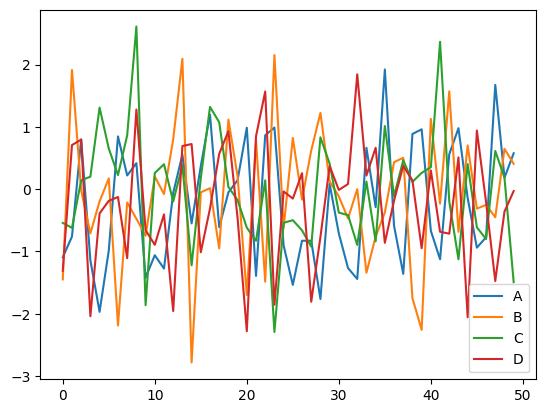

In [4]:
# Create a dataframe using a NumPy array that is 50 by 4
arr_1 = np.random.randn(50, 4)
df_1 = pd.DataFrame(arr_1, columns=['A','B','C','D'])
df_1.head()

# Compare old plots to a Plotly interactive plot
# You can save as PNG, Zoom, Pan, Turn off & on Data and more
df_1.plot()
df_1.iplot()

### Line Plots

In [5]:
# Allows us to create graph objects for making more customized plots
import plotly.graph_objects as go

# Use included Google price data to make one plot
df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels={'x':'Date', 'y':'Price'})

In [6]:
# Make multiple line plots
px.line(df_stocks, x='date', y=['GOOG','AAPL'], labels={'x':'Date', 'y':'Price'},
       title='Apple Vs. Google')

In [7]:
# Create a figure to which I'll add plots
fig = go.Figure()
# You can pull individual columns of data from the dataset and use markers or not
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, 
                        mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, 
                        mode='lines+markers', name='Amazon'))
# You can create custom lines (Dashes : dash, dot, dashdot)
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, 
                        mode='lines+markers', name='Google',
                        line=dict(color='firebrick', width=2, dash='dashdot')))
# Further style the figure
# fig.update_layout(title='Stock Price Data 2018 - 2020',
#                    xaxis_title='Price', yaxis_title='Date')

# Go crazy styling the figure
fig.update_layout(
    # Shows gray line without grid, styling fonts, linewidths and more
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    # Title alignment
    title={
        'text': "Stocks",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    # Turn off everything on y axis
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=False,
    ),
    autosize=False,
    margin=dict(
        autoexpand=False,
        l=100,
        r=20,
        t=110,
    ),
    showlegend=False,
    plot_bgcolor='white'
)

### Bar Charts

In [8]:
# Get population change in US by querying for US data
df_us = px.data.gapminder().query("country == 'United States'")
px.bar(df_us, x='year', y='pop')


In [9]:
# Create a stacked bar with more customization
df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day',
      labels={'tip': 'Tip Amount', 'day': 'Day of the Week'})


In [10]:
# Place bars next to each other
px.bar(df_tips, x="sex", y="total_bill",
             color='smoker', barmode='group')

In [11]:

# Display pop data for countries in Europe in 2007 greater than 2000000
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')
# Put bar total value above bars with 2 values of precision
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
# Set fontsize and uniformtext_mode='hide' says to hide the text if it won't fit
fig.update_layout(uniformtext_minsize=8)
# Rotate labels 45 degrees
fig.update_layout(xaxis_tickangle=-45)

### Scatter Plot

In [12]:
# Use included Iris data set
df_iris = px.data.iris()
# Create a scatter plot by defining x, y, different color for count of provided
# column, size based on supplied column and additional data to display on hover
px.scatter(df_iris, x="sepal_width", y="sepal_length", color="species",
                    size='petal_length', hover_data=['petal_width'])


In [13]:
# Create a customized scatter with black marker edges with line width 2, opaque
# and colored based on width. Also show a scale on the right
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width, y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(showscale=True)
))
fig.update_traces(marker_line_width=2, marker_size=10)


In [14]:
# Working with a lot of data use Scattergl
fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(100000),
    y = np.random.randn(100000),
    mode='markers',
    marker=dict(
        color=np.random.randn(100000),
        colorscale='Viridis',
        line_width=1
    )
))
fig

### Pie Charts

In [15]:
# Create Pie chart of the largest nations in Asia
# Color maps here plotly.com/python/builtin-colorscales/
df_samer = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
px.pie(df_samer, values='pop', names='country', 
       title='Population of Asian continent', 
       color_discrete_sequence=px.colors.sequential.RdBu)

In [16]:

# Customize pie chart
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water','Grass','Normal','Psychic', 'Fire', 'Ground'], 
                        values=[110,90,80,80,70,60])])
# Define hover info, text size, pull amount for each pie slice, and stroke
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)))

### Histograms

In [17]:
# Plot histogram based on rolling 2 dice
dice_1 = np.random.randint(1,7,5000)
dice_2 = np.random.randint(1,7,5000)
dice_sum = dice_1 + dice_2
# bins represent the number of bars to make
# Can define x label, color, title
# marginal creates another plot (violin, box, rug)
fig = px.histogram(dice_sum, nbins=11, labels={'value':'Dice Roll'},
              title='5000 Dice Roll Histogram', marginal='violin',
            color_discrete_sequence=['green'])

fig.update_layout(
    xaxis_title_text='Dice Roll',
    yaxis_title_text='Dice Sum',
    bargap=0.2, showlegend=False
)

In [18]:
# Stack histograms based on different column data
df_tips = px.data.tips()
px.histogram(df_tips, x="total_bill", color="sex")

### Box Plots

In [19]:
# A box plot allows you to compare different variables
# The box shows the quartiles of the data. The bar in the middle is the median 
# The whiskers extend to all the other data aside from the points that are considered
# to be outliers
df_tips = px.data.tips()
# We can see which sex tips the most, points displays all the data points
px.box(df_tips, x='sex', y='tip', points='all')

In [20]:
# Display tip sex data by day
px.box(df_tips, x='day', y='tip', color='sex')

In [21]:
# Adding standard deviation and mean
fig = go.Figure()
fig.add_trace(go.Box(x=df_tips.sex, y=df_tips.tip, marker_color='blue',
                    boxmean='sd'))

In [22]:

# Complex Styling
df_stocks = px.data.stocks()
fig = go.Figure()
# Show all points, spread them so they don't overlap and change whisker width
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all', name='Google',
                    fillcolor='blue', jitter=0.5, whiskerwidth=0.2))
fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all', name='Apple',
                    fillcolor='red', jitter=0.5, whiskerwidth=0.2))
# Change background / grid colors
fig.update_layout(title='Google vs. Apple', 
                  yaxis=dict(gridcolor='rgb(255, 255, 255)',
                  gridwidth=3),
                  paper_bgcolor='rgb(243, 243, 243)',
                  plot_bgcolor='rgb(243, 243, 243)')

### Violin Plot

In [23]:
# Violin Plot is a combination of the boxplot and KDE
# While a box plot corresponds to data points, the violin plot uses the KDE estimation
# of the data points
df_tips = px.data.tips()
px.violin(df_tips, y="total_bill", box=True, points='all')

In [24]:
# Multiple plots
px.violin(df_tips, y="tip", x="smoker", color="sex", box=True, points="all",
          hover_data=df_tips.columns)


In [25]:
# Morph left and right sides based on if the customer smokes
fig = go.Figure()
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'Yes' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'Yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue'))
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'No' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'No' ],
                        legendgroup='Yes', scalegroup='Yes', name='No',
                        side='positive',
                        line_color='red'))